In [250]:
import datetime
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
import statsmodels.api as sm

In [251]:
#Read in data
RawData=pd.read_csv('.\RawDatafiles\RainShelterBeta_Energy.dat.gz', #specify file path for data to read in
                         compression = 'gzip',  #file is ziped
                         parse_dates=True, #tell the function to parse date columns to datetime formats
                         dayfirst=True, #tell the function that the day is before the year in the data i.e format='%d/%m/%Y %H:%M'
                         skiprows = [0,2,3], #leave out rows 1, 3 and 4 which have redundant information
                         index_col = 0, #Use the first column, which is Date, as an index
                         na_values = 'NAN')

## Check index for duplicates

In [252]:
seen = {}
dupes = []

for x in RawData.index:
    if x not in seen:
        seen[x] = 1
    else:
        if seen[x] == 1:
            dupes.append(x)
        seen[x] += 1
dupes

[Timestamp('2015-11-12 10:10:00'),
 Timestamp('2015-11-12 10:20:00'),
 Timestamp('2015-11-12 10:30:00'),
 Timestamp('2015-11-12 10:40:00'),
 Timestamp('2015-11-12 10:50:00'),
 Timestamp('2015-11-12 11:00:00'),
 Timestamp('2015-11-12 11:10:00'),
 Timestamp('2015-11-12 11:20:00'),
 Timestamp('2015-11-12 11:30:00'),
 Timestamp('2015-11-12 11:40:00'),
 Timestamp('2015-11-12 11:50:00'),
 Timestamp('2015-11-12 12:00:00'),
 Timestamp('2015-11-12 12:10:00'),
 Timestamp('2015-11-12 12:20:00'),
 Timestamp('2015-11-12 12:30:00'),
 Timestamp('2015-11-12 12:40:00'),
 Timestamp('2015-11-12 12:50:00'),
 Timestamp('2015-11-12 13:00:00'),
 Timestamp('2015-11-12 13:10:00'),
 Timestamp('2015-11-12 13:20:00'),
 Timestamp('2015-11-12 13:30:00'),
 Timestamp('2015-11-12 13:40:00'),
 Timestamp('2015-11-12 13:50:00'),
 Timestamp('2015-11-12 14:00:00'),
 Timestamp('2015-11-12 14:10:00'),
 Timestamp('2015-11-12 14:20:00'),
 Timestamp('2015-11-12 14:30:00'),
 Timestamp('2015-11-12 14:40:00'),
 Timestamp('2015-11-

In [253]:
RawData.loc[dupes,:]

,RECORD,BattV_Avg,PTemp_C_Avg,AirTC_Avg,RH_Max,SlrkW_Avg,SlrMJ_Tot,Rain_mm_Tot,WS_ms_Avg,LeafWet_kohms_Avg,...,LinPAR_Avg(18),LinPAR_Avg(19),LinPAR_Avg(20),LinPAR_Avg(21),LinPAR_Avg(22),LinPAR_Avg(23),LinPAR_Avg(24),LinPAR_Avg(25),LinPAR_Avg(26),LinPAR_Avg(27)
TIMESTAMP,,,,,,,,,,,,,,,,,,,,,
2015-11-12 10:10:00,0,13.93,11.30,8.670,81.50,0.0,0.000485,0,4.512,NaN,...,160.10,142.00,147.70,127.40,148.8,124.00,164.60,335.9,311.1,347.2
2015-11-12 10:10:00,0,13.93,11.30,8.670,81.50,0.0,0.000485,0,4.512,NaN,...,160.10,142.00,147.70,127.40,148.8,124.00,164.60,335.9,311.1,347.2
2015-11-12 10:20:00,1,13.65,11.56,9.740,78.19,0.0,0.000971,0,6.852,305.20,...,344.90,273.90,337.00,302.10,341.5,281.80,349.40,728.1,634.6,777.7
2015-11-12 10:20:00,1,13.65,11.56,9.740,78.19,0.0,0.000971,0,6.852,305.20,...,344.90,273.90,337.00,302.10,341.5,281.80,349.40,728.1,634.6,777.7
2015-11-12 10:30:00,2,13.94,12.30,10.470,78.26,0.0,0.000485,0,6.942,5015.00,...,287.40,239.00,266.00,255.90,284.0,243.50,313.30,604.1,528.6,619.9
2015-11-12 10:30:00,2,13.94,12.30,10.470,78.26,0.0,0.000485,0,6.942,5015.00,...,287.40,239.00,266.00,255.90,284.0,243.50,313.30,604.1,528.6,619.9
2015-11-12 10:40:00,3,13.96,13.05,10.610,74.73,0.0,0.000607,0,6.766,7999.00,...,651.50,595.10,543.30,467.80,520.7,449.70,690.90,1151.0,1093.0,1152.0
2015-11-12 10:40:00,3,13.96,13.05,10.610,74.73,0.0,0.000607,0,6.766,7999.00,...,651.50,595.10,543.30,467.80,520.7,449.70,690.90,1151.0,1093.0,1152.0
2015-11-12 10:50:00,4,13.83,13.78,11.020,74.26,0.0,0.000607,0,6.918,7999.00,...,631.20,569.20,517.30,432.80,467.7,408.00,630.00,1089.0,1034.0,1089.0


## It seems all of these duplicate indexes have duplicated data

In [254]:
RawData.drop_duplicates(inplace=True)

## Check again for duplicates

In [255]:
seen = {}
dupes = []

for x in RawData.index:
    if x not in seen:
        seen[x] = 1
    else:
        if seen[x] == 1:
            dupes.append(x)
        seen[x] += 1
dupes

[]

In [256]:
#Bring in index data
DataIndex=pd.read_excel('.\IndexFiles\RadiationAndTempIndex.xlsx', 
                        sheet_name='Sensor positions',
                        usecols = range(9))
DataIndex.set_index('ColumnHeader',inplace=True)
# #Apply indexes to data
DataTransposed = RawData.transpose() 
DataIndexed = pd.concat([DataIndex,DataTransposed], axis=1,sort=False)
DataIndexed.index.name='ColumnHeader'
DataIndexed.set_index(['Measurement','Irrigation','Nitrogen','Treatment','Units','Summary','Plot','Block'], 
                         append=False, inplace=True)
Data=DataIndexed.transpose()
Data.index = pd.to_datetime(Data.index)  ## for some reason the concat function changes the data type on the date indes so need to change it back
Data = Data.drop(columns='Time',level=0) ## Drop blank time column
Data.sort_index(inplace=True)
Data.sort_index(axis=1,inplace=True)

## Set up Graphics Patterns

In [257]:
def SetGraphicsPatterns(Trt1,Trt2,ColumnIndex,Trt1Lines,Trt2Colors, GPs):
    GPs.Trt1Levels = list(ColumnIndex.get_level_values(0).drop_duplicates())
    print(Trt1)
    print(GPs.Trt1Levels)
    GPs.Trt2Levels = list(ColumnIndex.get_level_values(1).drop_duplicates())
    print(Trt2)
    print(GPs.Trt2Levels)
    GPs.Treatments = pd.MultiIndex.from_product([GPs.Trt1Levels,GPs.Trt2Levels])
    print('Treatments')
    print(GPs.Treatments)
    GPs.Styles = [(x,y) for x in Trt1Lines for y in Trt2Colors]
    print('Styles')
    print(GPs.Styles)
    GPs.StyleFrame = pd.DataFrame(index=GPs.Treatments,columns=['Lin','Col'],data = GPs.Styles)
    print(GPs.StyleFrame)
    
    GPs.TreatCombs = list(zip(ColumnIndex.get_level_values(0),
                          ColumnIndex.get_level_values(1)))
    print('TreatCombs')
    print(GPs.TreatCombs)
    GPs.ColorCycle = [GPs.StyleFrame.loc[x,'Col'] for x in GPs.TreatCombs]
    print('ColorCycle')
    print(GPs.ColorCycle)
    GPs.LineCycle = [GPs.StyleFrame.loc[x,'Lin'] for x in GPs.TreatCombs]
    print('LineCycle')
    print(GPs.LineCycle)
    
class GPs:
    Trt1Levels = []
    Trt2Levels = []
    Treatments = []
    Styles = []
    StyleFrame = pd.MultiIndex
    TreatCombs = []
    ColorCycle = []
    LineCycle = []
    
SetGraphicsPatterns('Irrigations',
                    'Nitrogens',
                    Data.IR_SurfaceTemp.columns,
                    ['-','--'],
                    ['orange','green','purple'], GPs)

Irrigations
['Dryland', 'Irrigated']
Nitrogens
['0', '250', '50']
Treatments
MultiIndex(levels=[['Dryland', 'Irrigated'], ['0', '250', '50']],
           labels=[[0, 0, 0, 1, 1, 1], [0, 1, 2, 0, 1, 2]])
Styles
[('-', 'orange'), ('-', 'green'), ('-', 'purple'), ('--', 'orange'), ('--', 'green'), ('--', 'purple')]
              Lin     Col
Dryland   0     -  orange
          250   -   green
          50    -  purple
Irrigated 0    --  orange
          250  --   green
          50   --  purple
TreatCombs
[('Dryland', '0'), ('Dryland', '0'), ('Dryland', '0'), ('Dryland', '0'), ('Dryland', '250'), ('Dryland', '250'), ('Dryland', '250'), ('Dryland', '250'), ('Dryland', '50'), ('Dryland', '50'), ('Dryland', '50'), ('Dryland', '50'), ('Irrigated', '0'), ('Irrigated', '0'), ('Irrigated', '0'), ('Irrigated', '0'), ('Irrigated', '250'), ('Irrigated', '250'), ('Irrigated', '250'), ('Irrigated', '250'), ('Irrigated', '50'), ('Irrigated', '50'), ('Irrigated', '50'), ('Irrigated', '50')]
ColorCycle
[

### Work out how long our date series in in weeks

In [258]:
from datetime import timedelta #Import function needed for doing date deltas 
FirstMeasurement  = Data.index.min(axis=0)
LastMeasurement = Data.index.max(axis=0)
Duration = (LastMeasurement - FirstMeasurement)/timedelta(weeks=1)
ExptDuration = np.round(Duration,decimals=0) #weeks
ExptDuration

18.0

### Graph data in two weekly blocks to see how it looks

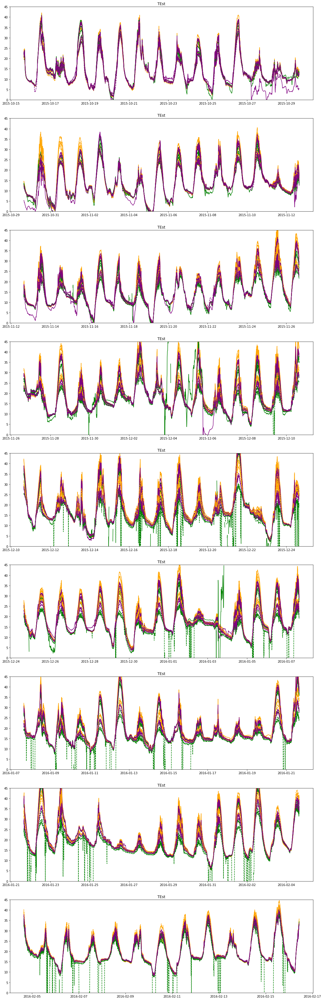

In [259]:
def MakeGraph(DataFrame,ymax,ymin):
    PlotDuration = 2
    Pannels = np.int(ExptDuration/PlotDuration)
    #Create a figure object
    for X in range (0,Pannels):
        if (X == 0):
            StartDate = Data.index.min(axis=0)  #Set start of series at start of data
        else: 
            StartDate = StartDate + timedelta(weeks=PlotDuration)    #increment start date by a week
        StartDateString = StartDate.strftime("%Y-%m-%d")  #Turn this to a string
        EndDate = StartDate + timedelta(weeks=PlotDuration)       #Set start date the specified duration before the end date 
        EndDateString = EndDate.strftime("%Y-%m-%d")           #Turn that into a string
        Position = X+1;
        ax = Fig.add_subplot(Pannels,1,Position)
        ax.set_prop_cycle(color=GPs.ColorCycle,linestyle=GPs.LineCycle)
        plt.title('TEst', fontsize=12);
        ax.plot(DataFrame.loc[StartDate:EndDate,:].index,DataFrame.loc[StartDate:EndDate,:]);
        plt.ylim(ymin,ymax)
        
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

### Some of the sensors have problems.  Check the sensor body temperature reference to work out why

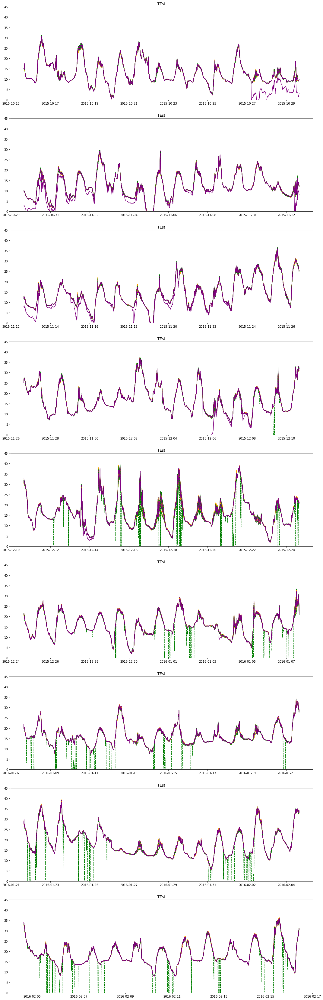

In [260]:
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SensorBodyTemp,45,0)

### There are problems with a few sensors which appears to be comming from problems with body temperature referece.  Need to identify this and drop the offending data

In [261]:
MedianBodyTemp = Data.IR_SensorBodyTemp.median(axis=1)
Deviation = pd.DataFrame(index = Data.IR_SensorBodyTemp.index,columns = Data.IR_SensorBodyTemp.columns)
for col in Deviation.columns:
    Deviation.loc[:,col] = Data.IR_SensorBodyTemp.loc[:,col] - MeanBodyTemp

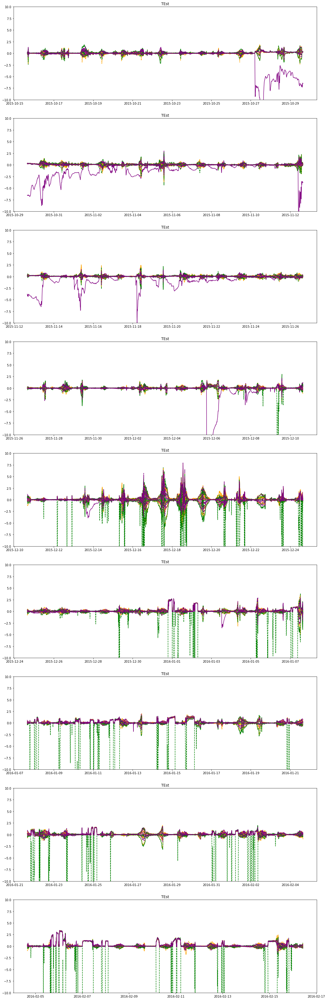

In [262]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Deviation,10,-10)

In [263]:
Data.IR_SurfaceTemp = Data.IR_SurfaceTemp.where(Deviation>-2.0,np.nan)

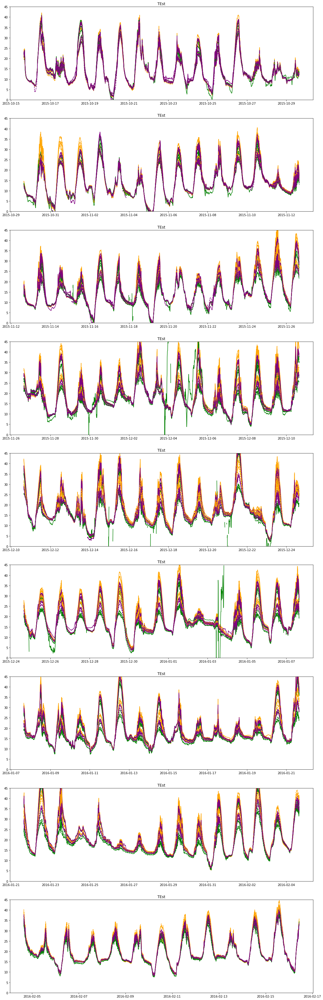

In [264]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

### There is still a problem with one sensor.  We will have to identify outliers relative to their treatment means.


In [265]:
Treatmedians = Data.IR_SurfaceTemp.groupby(level=['Irrigation','Nitrogen'],axis=1).median()
ST_Deviation = Deviation.copy()
for C in ST_Deviation.columns:
    ST_Deviation.loc[:,C] = Data.IR_SurfaceTemp.loc[:,C] - Treatmeans.loc[:,(C[0],C[1])]

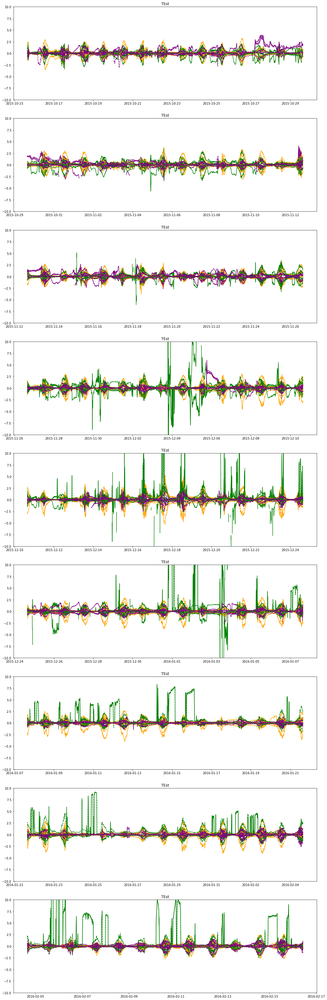

In [266]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(ST_Deviation,10,-10)


## Remove data anomolies relative to treatment means

In [267]:
Data.IR_SurfaceTemp = Data.IR_SurfaceTemp.where((ST_Deviation>-2) & (ST_Deviation<2),np.nan)

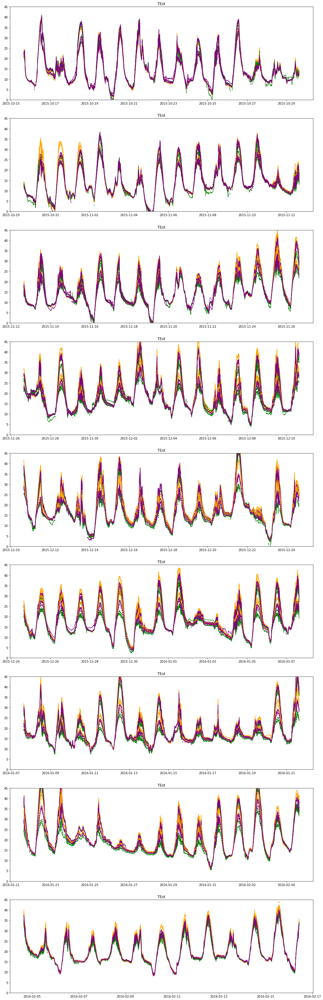

In [268]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.IR_SurfaceTemp,45,0)

## Data looks OK to progress with now

# Now lets look at soil temp

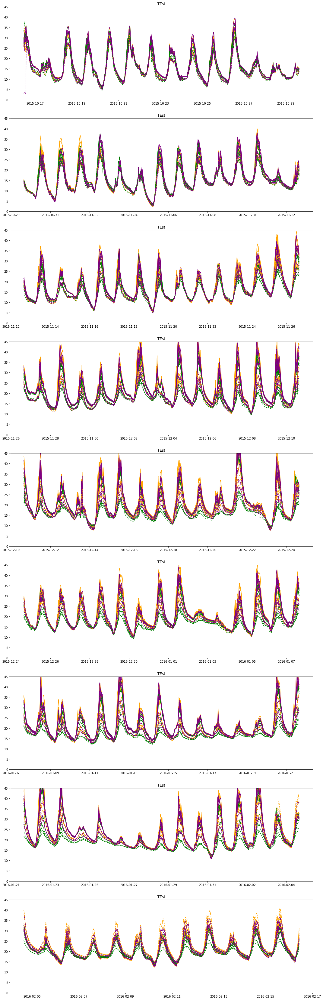

In [269]:
#Create a figure object
Fig = plt.figure(figsize=(18, 60))
MakeGraph(Data.SurfaceSoilTemp,45,0)

## No obvious outlyers, assume needs no cleaning

# Check Met Data.  Radiation first.

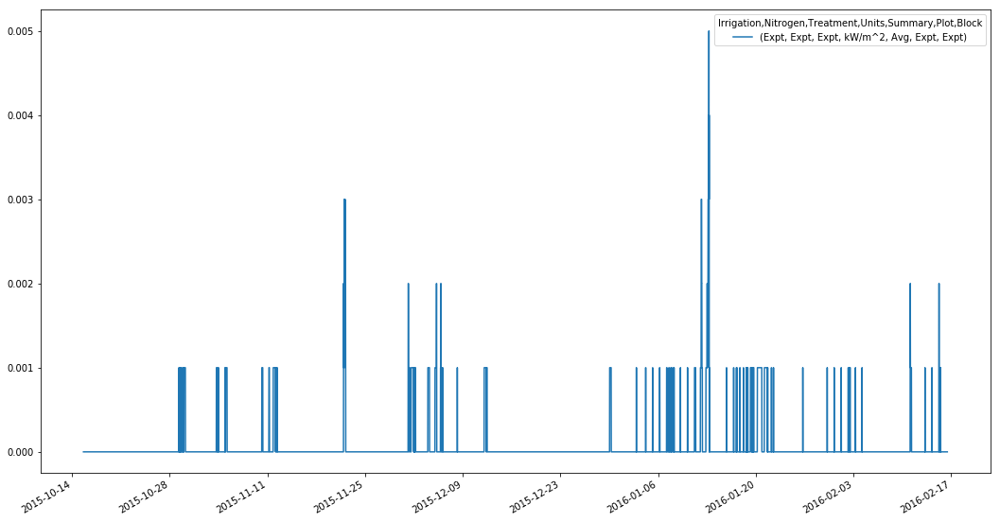

In [270]:
Data.IncomingRadnKW.plot(figsize = (18,10))

## Then Air Temperature

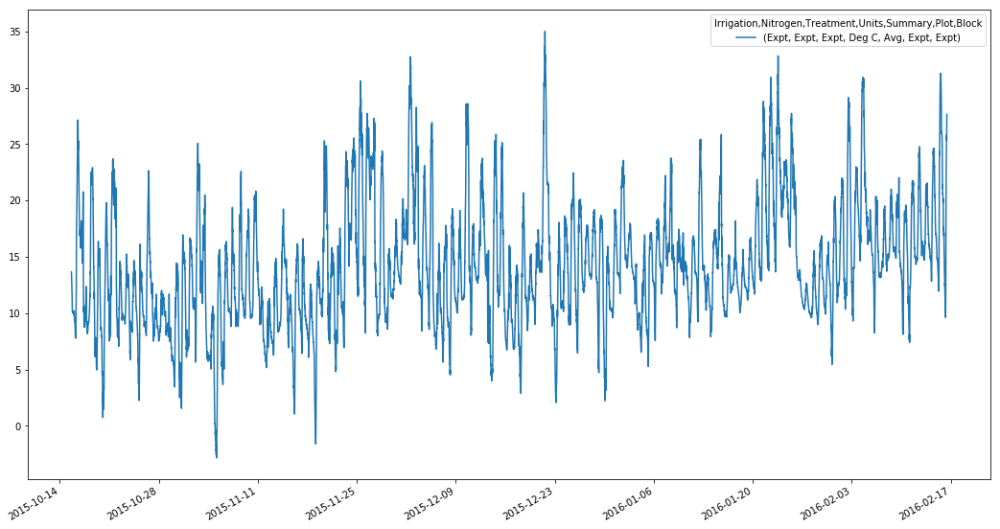

In [271]:
Data.AirTemperature.plot(figsize = (18,10))

## Check humidity

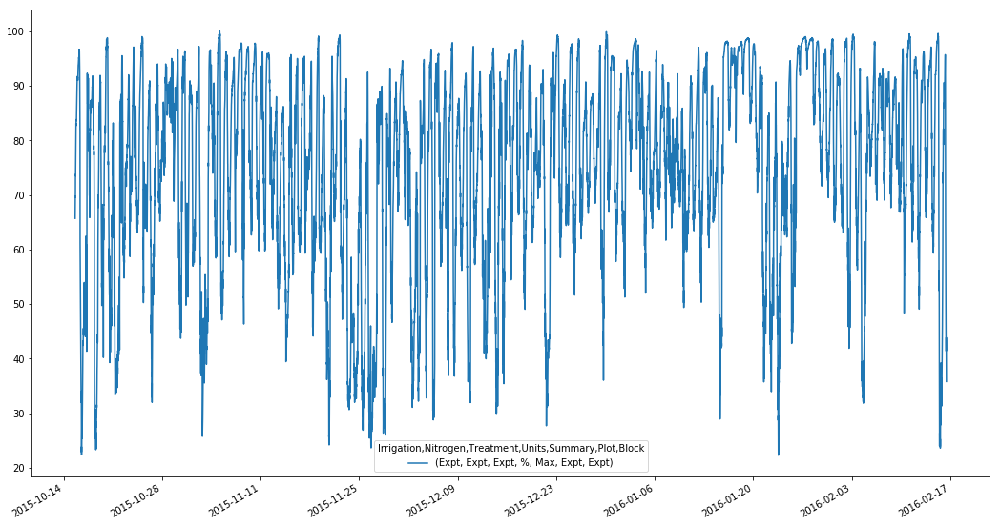

In [272]:
Data.RelativeHumidity.plot(figsize = (18,10))

## Check Wind

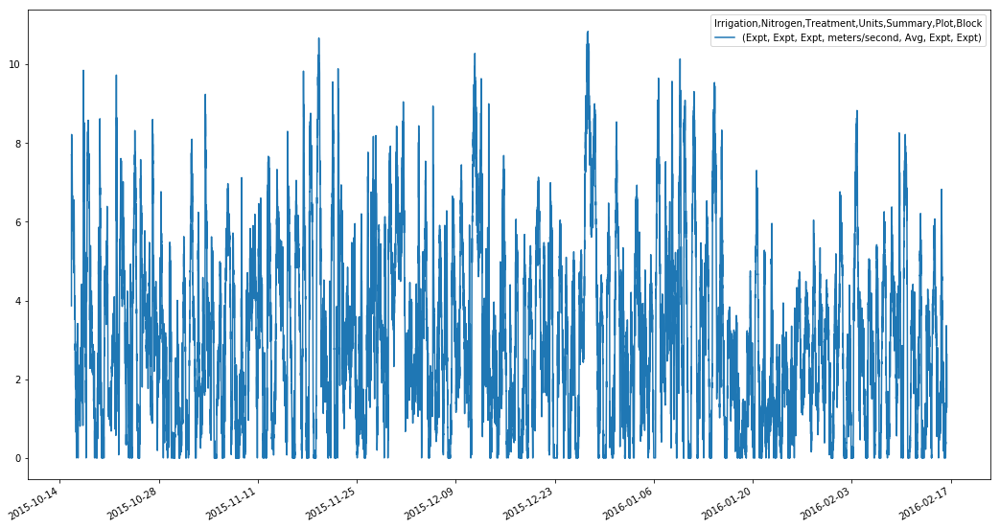

In [273]:
Data.Windspeed.plot(figsize = (18,10))

## Check Leaf Wettness

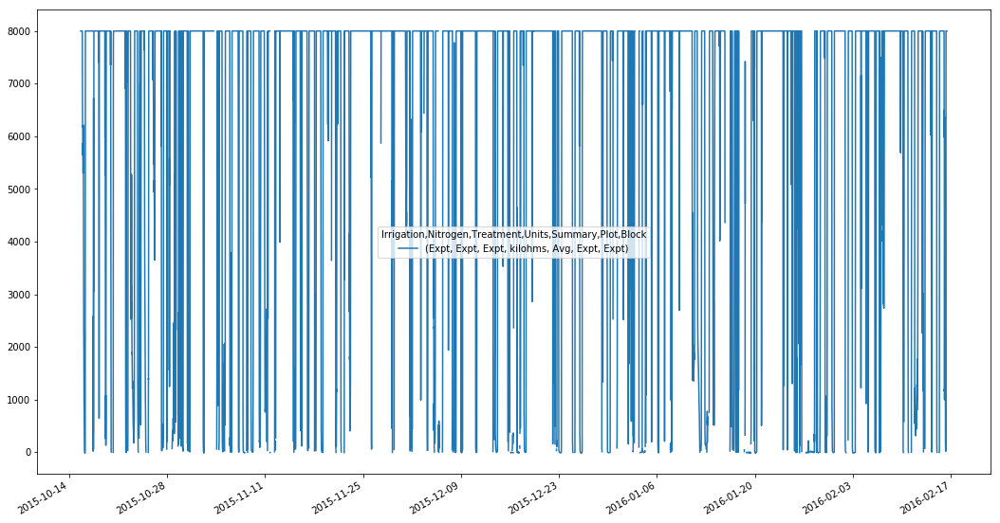

In [274]:
Data.Leafwetness.plot(figsize = (18,10))

## Now lets look at above canopy par

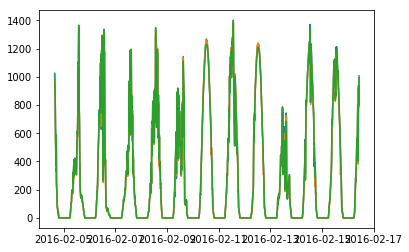

In [275]:
plt.plot(Data.AboveCanopyPAR1.loc[StartDate:EndDate,:])
plt.plot(Data.AboveCanopyPAR2.loc[StartDate:EndDate,:])
plt.plot(Data.AboveCanopyPAR3.loc[StartDate:EndDate,:])

## all three are behaving well so lets take the mean

In [276]:
Data.loc[:,('AboveCanopyPAR','Expt','Expt','Expt','mmolPAR','Ave','Expt','Expt')] = Data.loc[:,['AboveCanopyPAR1','AboveCanopyPAR2','AboveCanopyPAR3']].mean(axis=1)

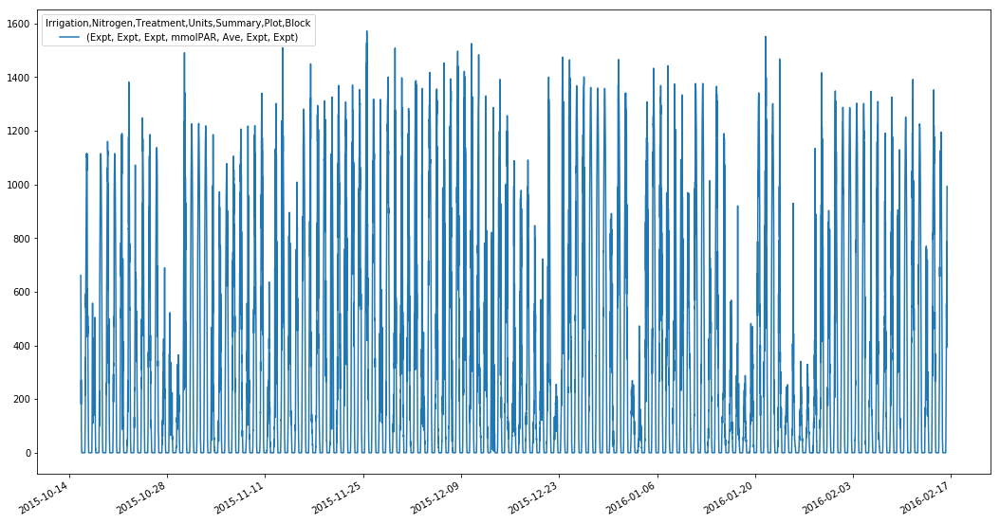

In [277]:
Data.AboveCanopyPAR.plot(figsize = (18,10))

In [278]:
Data.drop(columns = ['AboveCanopyPAR1','AboveCanopyPAR2','AboveCanopyPAR3'], level=0,inplace=True)

# Now we have a clean data set lets pickle it

In [144]:
Data.to_pickle('.\DataFrames\TempAndRadnCleaned.pkl')

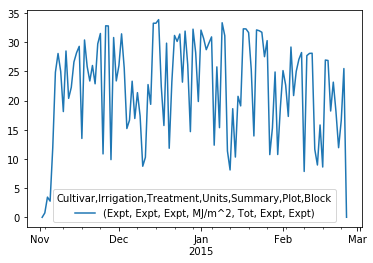

In [145]:
Data.IncomingRadnMJ.resample('d').sum().plot()

In [146]:
Data

Measurement         AirTemperature BatteryVoltage BelowCanopyPAR            \
Cultivar                      Expt           Expt           Dash             
Irrigation                    Expt           Expt           High             
Treatment                     Expt           Expt              3             
Units                        Deg C          Volts        mmolPAR             
Summary                        Avg            Avg            Avg             
Plot                          Expt           Expt            206  215  221   
Block                         Expt           Expt              1    3    4   
2014-11-02 21:50:00            NaN          12.88            NaN  NaN  NaN   
2014-11-02 22:00:00            NaN          12.88            NaN  NaN  NaN   
2014-11-02 22:10:00            NaN          12.88            NaN  NaN  NaN   
2014-11-02 22:20:00            NaN          12.88            NaN  NaN  NaN   
2014-11-02 22:30:00            NaN          12.88            NaN  NaN  NaN   
2014-11-02 22:40:00            NaN          12.85            NaN  NaN  NaN   
2014-11-02 22:50:00            NaN          12.86            NaN  NaN  NaN   
2014-11-02 23:00:00            NaN          12.79            NaN  NaN  NaN   
2014-11-02 23:10:00            NaN          12.85            NaN  NaN  NaN   
2014-11-02 23:20:00            NaN          12.84            NaN  NaN  NaN   
2014-11-02 23:30:00            NaN          12.84            NaN  NaN  NaN   
2014-11-02 23:40:00            NaN          12.82            NaN  NaN  NaN   
2014-11-02 23:50:00            NaN          12.76            NaN  NaN  NaN   
2014-11-03 00:00:00            NaN          12.81            NaN  NaN  NaN   
2014-11-03 00:10:00            NaN          12.81            NaN  NaN  NaN   
2014-11-03 00:20:00            NaN          12.80            NaN  NaN  NaN   
2014-11-03 00:30:00            NaN          12.80            NaN  NaN  NaN   
2014-11-03 00:40:00            NaN          12.79            NaN  NaN  NaN   
2014-11-03 00:50:00            NaN          12.80            NaN  NaN  NaN   
2014-11-03 01:00:00            NaN          12.79            NaN  NaN  NaN   
2014-11-03 01:10:00            NaN          12.80            NaN  NaN  NaN   
2014-11-03 01:20:00            NaN          12.80            NaN  NaN  NaN   
2014-11-03 01:30:00            NaN          12.78            NaN  NaN  NaN   
2014-11-03 01:40:00            NaN          12.78            NaN  NaN  NaN   
2014-11-03 01:50:00            NaN          12.79            NaN  NaN  NaN   
2014-11-03 02:00:00            NaN          12.78            NaN  NaN  NaN   
2014-11-03 02:10:00            NaN          12.79            NaN  NaN  NaN   
2014-11-03 02:20:00            NaN          12.79            NaN  NaN  NaN   
2014-11-03 02:30:00            NaN          12.79            NaN  NaN  NaN   
2014-11-03 02:40:00            NaN          12.79            NaN  NaN  NaN   
...                            ...            ...            ...  ...  ...   
2015-02-25 03:40:00          13.82          12.87            0.0  0.0  0.0   
2015-02-25 03:45:00          14.19          12.88            0.0  0.0  0.0   
2015-02-25 03:50:00          14.22          12.83            0.0  0.0  0.0   
2015-02-25 03:55:00          14.12          12.87            0.0  0.0  0.0   
2015-02-25 04:00:00          14.12          12.88            0.0  0.0  0.0   
2015-02-25 04:05:00          13.99          12.81            0.0  0.0  0.0   
2015-02-25 04:10:00          14.02          12.85            0.0  0.0  0.0   
2015-02-25 04:15:00          13.95          12.87            0.0  0.0  0.0   
2015-02-25 04:20:00          13.95          12.82            0.0  0.0  0.0   
2015-02-25 04:25:00          13.95          12.85            0.0  0.0  0.0   
2015-02-25 04:30:00          13.85          12.87            0.0  0.0  0.0   
2015-02-25 04:35:00          13.92          12.80            0.0  0.0  0.0   
2015-02-25 04:40:00   